# Cross-Correlations & Rayleigh-Wave H/V with Ambient Noise

## General Overview & Pre-Processing Options of Ambient Noise Tomography
### Goal: Retrieve the Estimated Green's Functions


## Let's do some ambient noise stuff!

The basic idea of Ambient Noise Tomography (ANT) is that by computing the cross-correlation of the records at two stations (given some important requirements that will not be discussed here) you obtain a waveform that is proportional to the Green's function between the two stations. 

In the frequency domain, the cross-spectrum
\begin{equation}
S_{xy} = \hat{X}^\ast(f)*\hat{Y}(f)
\end{equation}
where the $X^\ast$ represents the complex-conjugate of $X$.

Note that unlike the power spectra
\begin{equation}
S_{xx} = \hat{X}^\ast(f)*\hat{X}(f)
\end{equation}

the cross-spectrum is complex-valued. If you take the iFFT of the cross-spectrum, it is equivalent to the cross-correlation between two signals in the time domain. 

The codes below try to show you how the correlation function can be obtained using the FFT. As you will see, some sort of normalization is needed. 


In [1]:
# Imports...
import obspy
import numpy as np
import scipy
import scipy.signal as scisignal
import matplotlib.pyplot as plt

from PIL import Image as PILImage
from IPython.display import Image as IPImage

import pandas as pd


import os
import glob
from obspy.clients.fdsn import Client

import matplotlib 


#make a figure without it being interactive..
%matplotlib inline

In [2]:
# YOUR information... paths, etc

#main dir
mdir='/Users/emberg/Classes/UAF_Interview'

#dir with Raw Data (mseed files)
datadir=mdir+'/Data' #mdir+'/RawData'


## First, download some data!

We are focused on two stations, one in a basin and one in a mountain range. Feel free to switch up the stations as you like! 

Useful IRIS link. Check out available stations, and click on a station to see what instruments are included.
http://ds.iris.edu/gmap/#network=TA&channel=BHE&maxlat=72.4014&maxlon=-128.4961&minlat=53.1204&minlon=-170.4542&drawingmode=box&planet=earth

(link that does not spill beyond page boundaries, take out line breaks to copy/paste)
http://ds.iris.edu/gmap/#network=TA&channel=BHE&maxlat=72.4014
&maxlon=-128.4961&minlat=53.1204&minlon=-170.4542
&drawingmode=box&planet=earth

**Which stations are you going to use?** <br>
**What instruments are at these stations:** <br>
**Specifically, what type of seismometer?** <br> 
**What type of infrasound sensor?** <br>
**What other instruments are available?**

2017_1_1


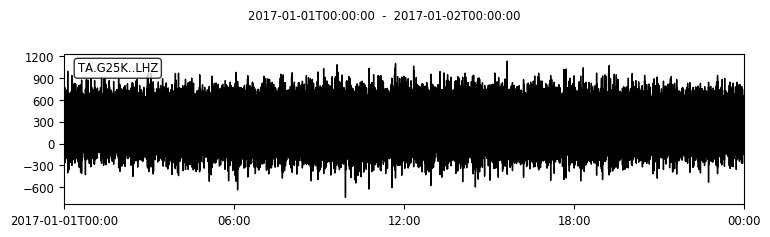

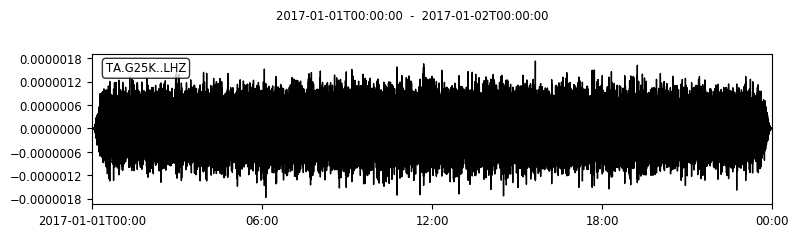

/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


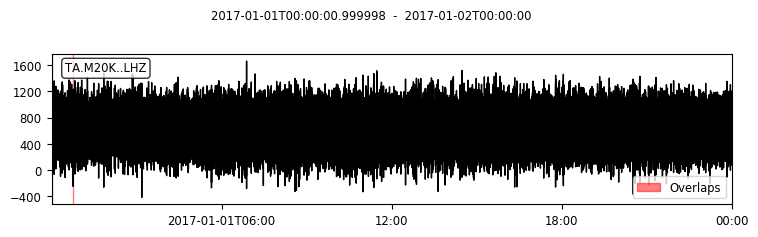

/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_2


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_3


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_4


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_5


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_6


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_7


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_8


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_9


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_10


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_11


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_12


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_13


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_14


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_15


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_16


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_17


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_18


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_19


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_20


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_21


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_22


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_23


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_24


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_25


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_26


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_27


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_28


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_29


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_30


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


2017_1_31


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


In [3]:
# download data from IRIS (you can skip this part if you downloaded the data tar file)

basinsta='G25K' #basin station name
mountainsta='M20K' #mountain station name
comp='LHZ' #component to download (make sure this is available for both stations via the IRIS webpage!)

# set up where to put each day..
year=2017
month=1 #check there will be data for this timerange on the IRIS webpage, too!
daystart=1
dayend=31

database='IRIS'
network='TA'

maxper=100
minper=2.5


client=Client(database)

dayarr=[]
# download each day, remove instrument response, demean, detrend, ensure is 1 full day (trim)
for ii in np.arange(daystart,dayend+1):
    dayname='%d_%d_%d'%(year,month,ii)
    dayarr.append(dayname)
    print(dayname)
    
    starttimetmp=obspy.UTCDateTime(year,month,ii)
    endtimetmp=starttimetmp+(60*60*24) #add a day: 60s/min * 60min/hr * 24hrs/day
    
    bst=client.get_waveforms(network=network,station=basinsta,location='',channel=comp,\
                             starttime=starttimetmp,endtime=endtimetmp,attach_response=True)
    
    #plot things as we go for the first day, to see how things compare..
    if ii==daystart:
        #plot the raw downloaded data
        bst.plot()
    bst.merge(method=0,fill_value=0)
    #remove the instrument response
    bst.remove_response(output="VEL") #note in obspy this is nm/s
        
    #demean, detrend and bandpass
    bst.detrend('demean')
    bst.detrend('linear')
    bst.taper(max_percentage=0.01,type='hann')
    #bandpass
    bst.filter('bandpass',freqmin=1./maxper,freqmax=1./minper,corners=4,zerophase=True)    
    #ensure is fully 1 day long..
    bst.trim(starttime=starttimetmp,endtime=endtimetmp,fill_value=0,pad=True)
    
    if ii==daystart:
        bst.plot()

    bst.write(datadir+'/'+basinsta+'.'+comp+'.'+dayname+'.mseed',format='mseed')

    #repeat for the mountain station!
    mst=client.get_waveforms(network=network,station=mountainsta,location='',channel=comp,\
                             starttime=starttimetmp,endtime=endtimetmp,attach_response=True)
    if ii==daystart:
        #plot the raw downloaded data
        mst.plot()
    mst.merge(method=0,fill_value=0)
    mst.remove_response(output="VEL")
    #demean, detrend and bandpass
    mst.detrend('demean')
    mst.detrend('linear')
    mst.taper(max_percentage=0.01,type='hann')
    mst.filter('bandpass',freqmin=1./maxper,freqmax=1./minper,corners=4,zerophase=True)
    mst.trim(starttime=starttimetmp,endtime=endtimetmp,fill_value=0,pad=True)
    mst.write(datadir+'/'+mountainsta+'.'+comp+'.'+dayname+'.mseed',format='mseed')
    
    #note, you can use a mass downloader command, but we're going to keep things simple here!
    

    #break #uncomment to run through loop only 1x (useful to check everything works..)


srcst:  1 Trace(s) in Stream:
TA.G25K..LHZ | 2017-01-01T00:00:00.000000Z - 2017-01-02T00:00:00.000000Z | 1.0 Hz, 86401 samples 

recst:  1 Trace(s) in Stream:
TA.M20K..LHZ | 2016-12-31T23:59:59.999998Z - 2017-01-01T23:59:59.999998Z | 1.0 Hz, 86401 samples 



Text(0.5, 1.0, 'Station M20K')

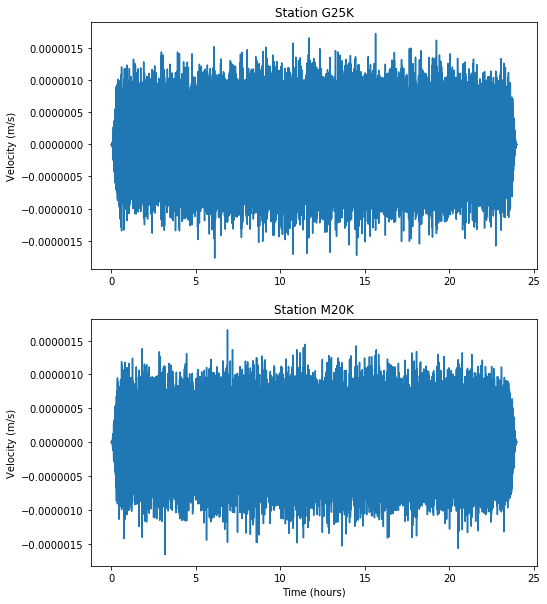

In [4]:
#let's look at what that first day looks like in the frequency domain for both stations..

#first, read in the stations and set up the times..

srcsta=basinsta
recsta=mountainsta

srcst=obspy.read(datadir+'/'+srcsta+'.'+comp+'.'+dayarr[0]+'.mseed')
recst=obspy.read(datadir+'/'+recsta+'.'+comp+'.'+dayarr[0]+'.mseed')
print('srcst: ',srcst,'\n')
print('recst: ',recst,'\n')

tr1    = srcst[0]
src   = tr1.data
tr2    = recst[0]
rec    = tr2.data
dt4    = tr1.stats.delta
nx4    = tr1.stats.npts   
t      = np.arange(nx4)*dt4


# Plot data
fig = plt.figure(figsize = (8,10))
ax = fig.add_subplot(211)
ax.plot(t/3600,src)
ax.set_ylabel('Velocity (m/s)');
ax.set_title('Station '+srcsta)
ax2 = fig.add_subplot(212)
ax2.plot(t/3600,rec)
ax2.set_xlabel('Time (hours)');
ax2.set_ylabel('Velocity (m/s)');
ax2.set_title('Station '+recsta)



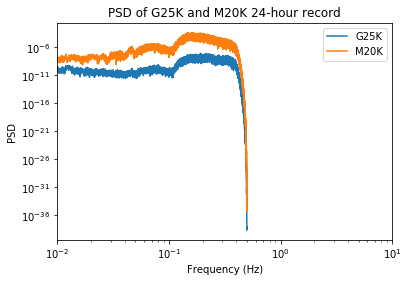

In [5]:

# Calculate PSD (hanning taper), with padding. 
npts   = nx4
npts2  = 2*npts+1   # make padding odd. 
nf4    = int((npts2+1)/2)   
hann   = np.hanning(npts)
freq4  = np.fft.fftfreq(npts2,dt4)
df4    = freq4[1]

# Taper signals
dat_src         = np.zeros(npts2)
dat_src[0:npts] = src*hann
dat_rec         = np.zeros(npts2)
dat_rec[0:npts] = rec*hann

# Get PSD, for ease we will not normalize.  
fsrc   = np.fft.fft(dat_src,npts2)
Psrc   = abs(fsrc)**2
frec   = np.fft.fft(dat_rec,npts2)
Prec   = abs(frec)**2

# Apply a smoothing operator, improve variance. 
nsmooth = 10
Psrc_smooth = np.convolve(Psrc, np.ones(nsmooth)/nsmooth)
Prec_smooth = np.convolve(Prec, np.ones(nsmooth)/nsmooth)

# Plot results
fig = plt.figure()
ax = fig.add_subplot(111)
ax.loglog(abs(freq4[0:nf4]),Psrc_smooth[0:nf4],label=srcsta)
ax.loglog(abs(freq4[0:nf4]),Prec_smooth[0:nf4]*5000,label=recsta)
ax.legend()
ax.set_xlim(0.01, 10);
ax.set_xlabel('Frequency (Hz)');
ax.set_ylabel('PSD');
ax.set_title('PSD of '+srcsta+' and '+recsta+' 24-hour record')
plt.show()

tdel: [-86402.         -86400.99998843 -86399.99997685 ...,  86399.99997685
  86400.99998843  86402.        ]


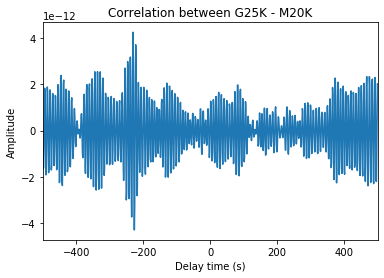

In [6]:
# Whole day cross-correlation & filter to desired frequency containing signal (around 2Hz here)

# Compute the cross spectrum, ifft to get cross-correlation
Sxy    = np.conj(fsrc)*frec
xycorr = np.real(np.fft.ifft(Sxy))
xycorr=np.fft.ifftshift(xycorr)

# Delay time vector
tdel  = np.linspace(-nf4*dt4,nf4*dt4,npts2)
print('tdel:',tdel)

# Filter cross-correlation
# freq in Hz
fmin=1/12 #1/Xsec
fmax = 1/8 #1/Xsec

fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')

#filter with Butterworth from last week
xycorr_filt = scisignal.filtfilt(b, a, xycorr)

#nofilter..
#xycorr_filt=xycorr

# filter with obspy.. This is an option, too!
#xycorr_filt=obspy.signal.filter.bandpass(np.array(xycorr),freqmin=1.5,freqmax=2.5,df=25,corners=4,zerophase=True)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(tdel,xycorr_filt)
ax.set_xlim(-500, 500);
#ax.set_xlim(-10, 10);
ax.set_xlabel('Delay time (s)');
ax.set_ylabel('Amplitude');
ax.set_title('Correlation between '+srcsta+' - '+recsta)
plt.show()

**What is the distance between the stations?**

**Approximately how fast does a surface wave travel?**

**When do you expect to see the surface wave signal, given this information?**

In [7]:
# let's loop through hour-long windows and see the impact of stacking..

#Loop over 1 hour segments, correlate, and stack
corrlen=500 #total delay for the correlation
nminutes=360 #number of minutes in cross-correlation
winlen=int(nminutes*60/dt4) #convert from minutes to nsamples

hourinds=np.arange(0,len(src),winlen)
outsamples=int(corrlen/dt4)

xcmatrix=[]


for dayidx in dayarr:
    srcst=obspy.read(datadir+'/'+srcsta+'.'+comp+'.'+dayidx+'.mseed')
    recst=obspy.read(datadir+'/'+recsta+'.'+comp+'.'+dayidx+'.mseed')
    #print('srcst: ',srcst,'\n')
    #print('recst: ',recst,'\n')

    tr1    = srcst[0]
    src   = tr1.data
    tr2    = recst[0]
    rec    = tr2.data
    dt4    = tr1.stats.delta
    nx4    = tr1.stats.npts   
    t      = np.arange(nx4)*dt4
    
    for ii in range(len(hourinds)-1):
        #print('on time index: ',ii)
        starti=hourinds[ii]
        stopi=hourinds[ii+1]

        #Cut the traces to winlen
        ttsrc=src[starti:stopi]
        ttrec=rec[starti:stopi]

        ## Pre-Processing (demean, detrend, temporal normalization, spectral whitening, etc) ##
        #1. Demean
        x4    = scisignal.detrend(ttsrc,type='constant')
        y4    = scisignal.detrend(ttrec, type='constant')

        
        #2. Detrend
        x4    = scisignal.detrend(x4,type='linear')
        y4    = scisignal.detrend(y4, type='linear')

        
        # Calculate hanning taper info, with padding. 
        if ii==0:
            #no sense in getting these more than the inital run-through as should not change
            npts   = len(ttsrc)#nx4
            npts2  = 2*npts+1   # make padding odd. 

            #fun trick!
            npts2=scipy.fftpack.next_fast_len(npts2) #get faster array length for fft purposes

            nf4    = int((npts2+1)/2)  #cross-correlation window length 
            hann   = np.hanning(npts)

            #Don't need this, so skip following 2 lines here, included for reference
            #freq4  = np.fft.fftfreq(npts2,dt4) #return discrete fourier transform sample frequencies
            #df4    = freq4[1]


        #3. Taper signals, add padding
        dat_x4         = np.zeros(npts2)
        dat_x4[0:npts] = x4*hann
        dat_y4         = np.zeros(npts2)
        dat_y4[0:npts] = y4*hann

        # FFT of data
        fx4   = np.fft.fft(dat_x4,npts2)
        fy4   = np.fft.fft(dat_y4,npts2)

        #Correlate
        Sxy    = np.conj(fx4)*fy4
        xycorr = np.real(np.fft.ifft(Sxy))
        xycorr = np.fft.ifftshift(xycorr)

        # Delay time vector, same as above.. only run on the first round
        if ii==0:
            tdel  = np.linspace(-nf4*dt4,nf4*dt4,npts2)

        xcmatrix.append(xycorr)
        
print('complete!')

complete!


Text(0.5, 0, 'Time (s)')

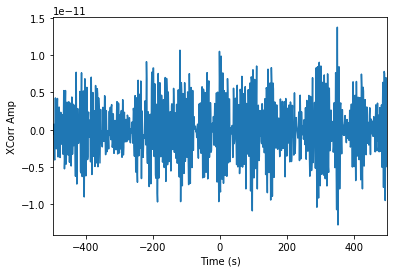

In [8]:
#check things look ok (something was output) for a random hour.. Perhaps the 15th hour?

plt.plot(tdel,xcmatrix[15])
plt.xlim(-500,500)
plt.ylabel('XCorr Amp')
plt.xlabel('Time (s)')

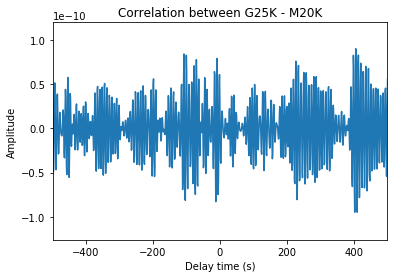

In [9]:
#apply a filter and plot a single hour (the last hour)

fmin=1/14
fmax = 1/6

fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')
xycorr_filt = scisignal.filtfilt(b, a, xycorr) #note xycorr is the last hour we computed

# Included for reference..
#nofilter..
#xycorr_filt=xycorr
# filter with obspy..
#xycorr_filt=obspy.signal.filter.bandpass(np.array(xycorr),freqmin=1.5,freqmax=2.5,df=25,corners=4,zerophase=True)

#make a figure
fig = plt.figure()
ax = fig.add_subplot(111)
ax.plot(tdel,xycorr_filt)
ax.set_xlim(-500, 500);
ax.set_xlabel('Delay time (s)');
ax.set_ylabel('Amplitude');
ax.set_title('Correlation between '+srcsta+' - '+recsta)
plt.show()

In [10]:
#next, stack & plot (see the impact of stacking before we do any extra pre-processing steps)


#output fig files after each hour of stacking
outfigdir=mdir+'/StackHoursPngs'
if not os.path.isdir(outfigdir):
    os.mkdir(outfigdir)

### CAREFUL! ###
#remove previous files -- CAREFUL!
pngfiles=glob.glob(outfigdir+'/*png')
for f in pngfiles:
    os.remove(f)


    
#Compute sum -- this is empty for now, we will add to it!
sumxc=xcmatrix[0]*0

#bandpass info (applied when plotting, not in stack)
fmin=1/14
fmax = 1/6
fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')

# count the hours
ic=0


#initiate figure that we will write over
fig=plt.figure(3,figsize=[10,5])

for xc in xcmatrix:
    
    if np.max(np.abs(xc))==0:
        continue
    
    #normalize each hour so each contributes evenly
    sumxc=sumxc+np.multiply(1/np.max(np.abs(xc)),xc)
    
    
    #great! Now bandpass this signal...
    sumxctmp = scisignal.filtfilt(b, a, sumxc)
    
    #can also use obspy...
    #sumxctmp=obspy.signal.filter.bandpass(np.array(sumxc),freqmin=1.5,freqmax=2.5,df=25,corners=4,zerophase=True)
    
    
    sumxctmp=np.multiply(1/np.max(np.abs(sumxctmp)),sumxctmp) #normalize
    
    #make the figures...
    plt.plot(tdel,sumxctmp);
    plt.ylim(-1,1)
    plt.xlim(-500,500)
    ic=ic+1;
    
    ### NOTE that if the gif comes out in a not-correct order, you can instead try one of the following ###
    #      (every OS is different, so this may take some trial & error): 
    # 1. icstr='%d' % (ic); outf=outfigdir+'/corr'+icstr.zfill(3)+'.png'
    # 2. icstr='%5.0f' % (ic); outf=outfigdir+'/corr'+icstr.zfill(3)+'.png'
    # 3. icstr='%5.0f' % (ic); outf=outfigdir+'/corr_00'+icstr.zfill(3)+'.png'
    # You can also see how your OS lists the png files in the dir they are located and use that as an idea of the order
    #   the png's will probably be combined below.
    plt.title('Hours Stacked: '+str(ic))
    outf=outfigdir+'/corr'+str(ic).zfill(3)+'.png'
    plt.savefig(outf)
    plt.clf()
    
print('completed figures..')

completed figures..


<Figure size 720x360 with 0 Axes>

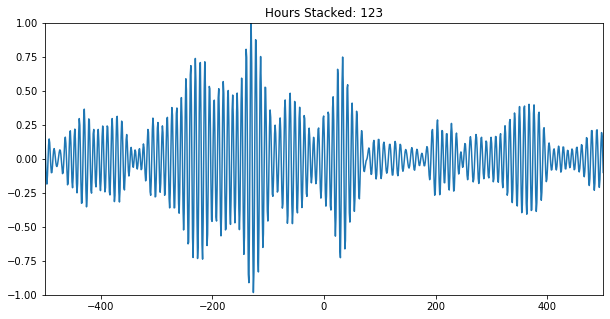

In [11]:
#plot just the final stack..

fmin=1/12
fmax = 1/8
fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')

#Compute sum -- this is empty for now, we will add to it!
sumxc=xcmatrix[0]*0


count=0
for xc in xcmatrix:
    
    if np.max(np.abs(xc))==0:
        continue
    
    #normalize each hour so each contributes evenly
    sumxc=sumxc+np.multiply(1/np.max(np.abs(xc)),xc)
    
    count=count+1
     

fig=plt.figure(4,figsize=[10,5])
#filter the final result..
#sumxctmp=obspy.signal.filter.bandpass(np.array(sumxc),freqmin=1.5,freqmax=2.5,df=25,corners=4,zerophase=True)
sumxctmp = scisignal.filtfilt(b, a, sumxc)
sumxctmp=np.multiply(1/np.max(np.abs(sumxctmp)),sumxctmp) #normalize

#plot it up..
plt.plot(tdel,sumxctmp);
plt.ylim(-1,1)
plt.xlim(-500,500)
plt.title('Hours Stacked: '+str(ic))
plt.show()

In [12]:
#convert from png's to a gif

ic=0
frames=[]
imgs=glob.glob(outfigdir+'/*.png')
for ic in np.arange(1,len(xcmatrix)+1):
    if not os.path.isfile(outfigdir+'/corr'+str(ic).zfill(3)+'.png'):
        continue
    print(outfigdir+'/corr'+str(ic).zfill(3)+'.png')
    new_frame=PILImage.open(outfigdir+'/corr'+str(ic).zfill(3)+'.png')
    frames.append(new_frame)
    
frames[0].save(outfigdir+'/Src_Rec_Hours.gif',format='GIF',append_images=frames[1:],save_all=True,duration=743,loop=0)

print('completed gif! Location:',outfigdir+'/Src_Rec_Hours.gif')

/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr001.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr002.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr003.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr004.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr005.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr006.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr007.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr008.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr009.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr010.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr011.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr012.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr013.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr014.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr015.png
/Users/emberg/Classes/UAF_Interview/StackHoursPngs/corr

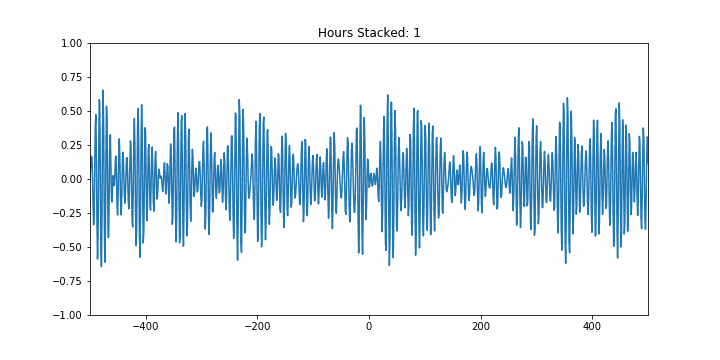

In [13]:
#Look at the gif

#insert the outputfigdir+'/'Src_Rec_Hours.gif (or whatever name you chose) from output of above cell
stream=outfigdir+'/Src_Rec_Hours.gif'

IPImage(stream)




**Where in time do you see the expected surface wave energy packet?**

**What velocity did this wave propagate from the source to receiver station?**

**How many stacked hours does it take for that packet to first stabilize?**

# Temporal Normalization Options

*Note that there are **many** ways to apply temporal normalization to you data, and sometimes it is not needed!* 


## Option 1: 1-Bit Normalization (what it sounds like)

## Option 2: Running mean - multiple ways to do this

1. Bandpass to 15-50s (band containing energetic surface wave signals from earthquakes [Lin et al., 2007])
2. Mean of absolute value from seismogram computed in 128s window centered on this point [Lin et al., 2007]

## Option 3: remove spikes, or associations with Earthquakes 

There are multiple ways to do this. 
For example, discard window, zero & taper around detected signal, etc..!
For example: Remove all signals if > threshold, remove length of time around detected signal > threshold, etc

**How would you apply Option 3?**


**What are the pros/cons of the different temporal normalization options (1, 2, 3)?**



In [14]:
# Option 1: 1-Bit Normalization

# Loop through the windows & apply 1-bit normalization before cross-correlating, stack result for comparison
# let's loop through hour-long windows and see the impact of stacking..

#Loop over 1 hour segments, correlate, and stack
corrlen=500 #total delay for the correlation
nminutes=360 #number of minutes in cross-correlation
winlen=int(nminutes*60/dt4) #convert from minutes to nsamples

hourinds=np.arange(0,len(src),winlen)
outsamples=int(corrlen/dt4)

xcmatrix_1bit=[]


for dayidx in dayarr:
    srcst=obspy.read(datadir+'/'+srcsta+'.'+comp+'.'+dayidx+'.mseed')
    recst=obspy.read(datadir+'/'+recsta+'.'+comp+'.'+dayidx+'.mseed')
    #print('srcst: ',srcst,'\n')
    #print('recst: ',recst,'\n')

    tr1    = srcst[0]
    src   = tr1.data
    tr2    = recst[0]
    rec    = tr2.data
    dt4    = tr1.stats.delta
    nx4    = tr1.stats.npts   
    t      = np.arange(nx4)*dt4
    
    for ii in range(len(hourinds)-1):
        #print('on time index: ',ii)
        starti=hourinds[ii]
        stopi=hourinds[ii+1]

        #Cut the traces to winlen
        ttsrc=src[starti:stopi]
        ttrec=rec[starti:stopi]

        ## Pre-Processing (demean, detrend, temporal normalization, spectral whitening, etc) ##
        #1. Demean
        x4    = scisignal.detrend(ttsrc,type='constant')
        y4    = scisignal.detrend(ttrec, type='constant')

        
        #2. Detrend
        x4    = scisignal.detrend(x4,type='linear')
        y4    = scisignal.detrend(y4, type='linear')

        
        # Calculate hanning taper info, with padding. 
        if ii==0:
            #no sense in getting these more than the inital run-through as should not change
            npts   = len(ttsrc)#nx4
            npts2  = 2*npts+1   # make padding odd. 

            #fun trick!
            npts2=scipy.fftpack.next_fast_len(npts2) #get faster array length for fft purposes

            nf4    = int((npts2+1)/2)  #cross-correlation window length 
            hann   = np.hanning(npts)

            #Don't need this, so skip following 2 lines here, included for reference
            #freq4  = np.fft.fftfreq(npts2,dt4) #return discrete fourier transform sample frequencies
            #df4    = freq4[1]


        #3. Taper signals, add padding
        dat_x4         = np.zeros(npts2)
        dat_x4[0:npts] = x4*hann
        dat_y4         = np.zeros(npts2)
        dat_y4[0:npts] = y4*hann
        
        #### NEW!!!!!!!!!! #######
        # Apply 1-bit normalization after taper #
        dat_x4[0:npts] = np.sign(x4*hann)
        dat_y4[0:npts] = np.sign(y4*hann)

        # FFT of data
        fx4   = np.fft.fft(dat_x4,npts2)
        fy4   = np.fft.fft(dat_y4,npts2)

        #Correlate
        Sxy    = np.conj(fx4)*fy4
        xycorr = np.real(np.fft.ifft(Sxy))
        xycorr = np.fft.ifftshift(xycorr)

        # Delay time vector, same as above.. only run on the first round
        if ii==0:
            tdel  = np.linspace(-nf4*dt4,nf4*dt4,npts2)

        xcmatrix_1bit.append(xycorr)

print('finished xcorr!')

finished xcorr!


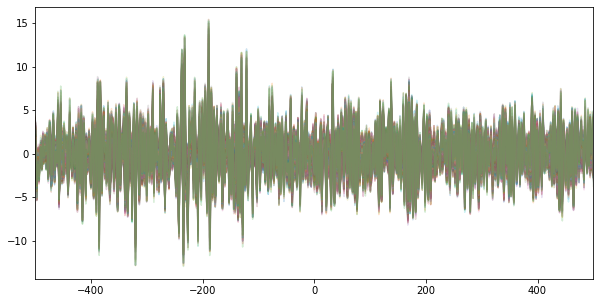

finished stacking! onto the plot..


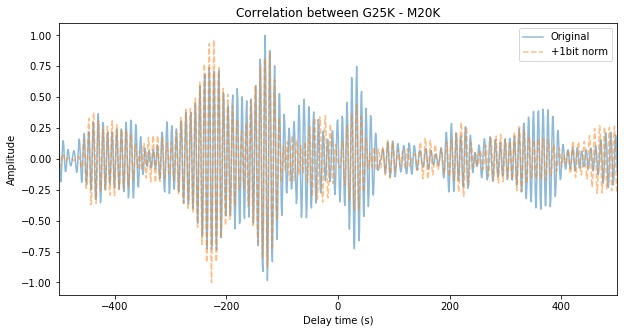

In [15]:
### COMBINE EVERYTHING TOGETHER TO RUN QUICKLY ###

# stack results 
fig=plt.figure(5,figsize=[10,5])
sumxc_1bit=xcmatrix_1bit[0]*0
for xc in xcmatrix_1bit:
    if np.max(np.abs(xc))==0:
        continue
    sumxc_1bit=sumxc_1bit+np.multiply(1/np.max(np.abs(xc)),xc)
    
    plt.plot(tdel,sumxc_1bit,alpha=0.2)
    plt.xlim(-500,500)
plt.show()
print('finished stacking! onto the plot..')

# plot final bp of stack

fmin=1/12 #1/Xsec
fmax = 1/8 #1/Xsec

fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')

xcorr_filt = scisignal.filtfilt(b, a, sumxc)
xcorr1b_filt = scisignal.filtfilt(b, a, sumxc_1bit)

#normalize
xcorr_filt=np.multiply(1/np.max(np.abs(xcorr_filt)),xcorr_filt) #normalize
xcorr1b_filt=np.multiply(1/np.max(np.abs(xcorr1b_filt)),xcorr1b_filt) #normalize

#nofilter..
#xycorr_filt=xycorr

# filter with obspy..
#xycorr_filt=obspy.signal.filter.bandpass(np.array(xycorr),freqmin=1.5,freqmax=2.5,df=25,corners=4,zerophase=True)

fig=plt.figure(6,figsize=[10,5])
ax = fig.add_subplot(111)
ax.plot(tdel,xcorr_filt,label='Original',alpha=0.5)
ax.plot(tdel,xcorr1b_filt,label='+1bit norm',alpha=0.5,linestyle='--')
ax.legend()
ax.set_xlim(-500, 500);
ax.set_xlabel('Delay time (s)');
ax.set_ylabel('Amplitude');
ax.set_title('Correlation between '+srcsta+' - '+recsta)
plt.show()

on time index:  0


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


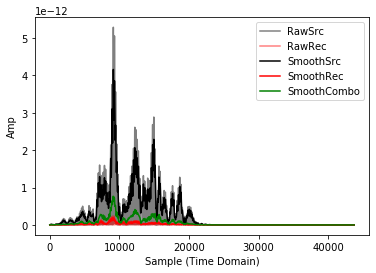

In [16]:
# test out the running mean..

#Loop over 1 hour segments, correlate, and stack
corrlen=500 #total delay for the correlation
nminutes=360 #number of minutes in cross-correlation
winlen=int(nminutes*60/dt4) #convert from minutes to nsamples

hourinds=np.arange(0,len(src),winlen)
outsamples=int(corrlen/dt4)

xcmatrix_cohe=[]

for dayidx in dayarr:
    srcst=obspy.read(datadir+'/'+srcsta+'.'+comp+'.'+dayidx+'.mseed')
    recst=obspy.read(datadir+'/'+recsta+'.'+comp+'.'+dayidx+'.mseed')
    #print('srcst: ',srcst,'\n')
    #print('recst: ',recst,'\n')

    tr1    = srcst[0]
    src   = tr1.data
    tr2    = recst[0]
    rec    = tr2.data
    dt4    = tr1.stats.delta
    nx4    = tr1.stats.npts   
    t      = np.arange(nx4)*dt4
    break #grab just the first day...

# we will look at just one hour (notice the 'break' in the loop below)
for ii in range(len(hourinds)-1):
    print('on time index: ',ii)
    starti=hourinds[ii]
    stopi=hourinds[ii+1]
    
    #Cut the traces to winlen
    ttsrc=src[starti:stopi]
    ttrec=rec[starti:stopi]
    
    ## Pre-Processing (demean, detrend, temporal normalization, spectral whitening, etc) ##
    #1. Demean
    x4    = scisignal.detrend(ttsrc,type='constant')
    y4    = scisignal.detrend(ttrec, type='constant')
    
    #print('demean complete')
    
    #2. Detrend
    x4    = scisignal.detrend(x4,type='linear')
    y4    = scisignal.detrend(y4, type='linear')
    
    #print('demean and detrend complete')
    
    # Calculate hanning taper info, with padding. 
    if ii==0:
        #no sense in getting these more than the inital run-through as should not change
        npts   = len(ttsrc)#nx4
        npts2  = 2*npts+1   # make padding odd. 
        npts2=scipy.fftpack.next_fast_len(npts2) #get faster array length for fft purposes
        
        nf4    = int((npts2+1)/2)  #cross-correlation window length 
        hann   = np.hanning(npts)
        #freq4  = np.fft.fftfreq(npts2,dt4) #return discrete fourier transform sample frequencies
        #df4    = freq4[1]
        
        
    #3. Taper signals, add padding
    dat_x4 = np.zeros(npts2)
    dat_y4 = np.zeros(npts2)
    dat_x4[0:npts] = x4*hann
    dat_y4[0:npts] = y4*hann
    
    
    #plt.plot(dat_x4[0:npts])
    
    break


#Frequencies expect surface waves to contaminate signal from earthquakes (Lin et al., 2007)...    
eqfmin=0.02 #50s
eqfmax =0.067 #15s

eqtempx=obspy.signal.filter.bandpass(np.array(dat_x4),freqmin=eqfmin,freqmax=eqfmax,df=25,corners=4,zerophase=True)
eqtempy=obspy.signal.filter.bandpass(np.array(dat_y4),freqmin=eqfmin,freqmax=eqfmax,df=25,corners=4,zerophase=True)

eqsmoothN=int(128/dt4) #get samples to smooth over..

#cheap rma..
#more information on this application of rma (described nicely by lapis on stackoverflow):
# https://stackoverflow.com/questions/13728392/moving-average-or-running-mean

eq_smoothx = np.convolve(np.abs(eqtempx), np.ones(eqsmoothN)/eqsmoothN,mode='same')
eq_smoothy = np.convolve(np.abs(eqtempy), np.ones(eqsmoothN)/eqsmoothN,mode='same')
eq_smooth=np.sqrt(eq_smoothx*eq_smoothy)

dat2_x4= dat_x4/(eq_smooth)
dat2_y4= dat_y4/(eq_smooth)


#plot...

plt.plot(np.abs(eqtempx),label='RawSrc',alpha=0.5,c='k')
plt.plot(np.abs(eqtempy),label='RawRec',alpha=0.5,c='r')
plt.plot(eq_smoothx,c='k',label='SmoothSrc')
plt.plot(eq_smoothy,c='r',label='SmoothRec')
plt.plot(eq_smooth,c='g',label='SmoothCombo')
plt.xlabel('Sample (Time Domain)')
plt.ylabel('Amp')
plt.legend()

plt.show()


In [17]:
# Option 2: RMA temporal normalization
#bandpass to 15-50s (band containing energetic surface wave signals from earthquakes [Lin et al., 2007])
#Mean of absolute value from seismogram computed in 128s window centered on this point [Lin et al., 2007]
eqfmin=0.02 #50s
eqfmax =0.067 #15s


#Loop over 1 hour segments, correlate, and stack
corrlen=500 #total delay for the correlation
nminutes=360 #number of minutes in cross-correlation
winlen=int(nminutes*60/dt4) #convert from minutes to nsamples

hourinds=np.arange(0,len(src),winlen)
outsamples=int(corrlen/dt4)

xcmatrix_trma=[]



for dayidx in dayarr:
    srcst=obspy.read(datadir+'/'+srcsta+'.'+comp+'.'+dayidx+'.mseed')
    recst=obspy.read(datadir+'/'+recsta+'.'+comp+'.'+dayidx+'.mseed')
    #print('srcst: ',srcst,'\n')
    #print('recst: ',recst,'\n')

    tr1    = srcst[0]
    src   = tr1.data
    tr2    = recst[0]
    rec    = tr2.data
    dt4    = tr1.stats.delta
    nx4    = tr1.stats.npts   
    t      = np.arange(nx4)*dt4
    
    for ii in range(len(hourinds)-1):
        #print('on time index: ',ii)
        starti=hourinds[ii]
        stopi=hourinds[ii+1]

        #Cut the traces to winlen
        ttsrc=src[starti:stopi]
        ttrec=rec[starti:stopi]

        ## Pre-Processing (demean, detrend, temporal normalization, spectral whitening, etc) ##
        #1. Demean
        x4    = scisignal.detrend(ttsrc,type='constant')
        y4    = scisignal.detrend(ttrec, type='constant')

        #print('demean complete')

        #2. Detrend
        x4    = scisignal.detrend(x4,type='linear')
        y4    = scisignal.detrend(y4, type='linear')

        #print('demean and detrend complete')

        # Calculate hanning taper info, with padding. 
        if ii==0:
            #no sense in getting these more than the inital run-through as should not change
            npts   = len(ttsrc)#nx4
            npts2  = 2*npts+1   # make padding odd. 
            npts2=scipy.fftpack.next_fast_len(npts2) #get faster array length for fft purposes

            nf4    = int((npts2+1)/2)  #cross-correlation window length 
            hann   = np.hanning(npts)
            #freq4  = np.fft.fftfreq(npts2,dt4) #return discrete fourier transform sample frequencies
            #df4    = freq4[1]


        #3. Taper signals, add padding
        dat_x4 = np.zeros(npts2)
        dat_y4 = np.zeros(npts2)
        dat_x4[0:npts] = x4*hann
        dat_y4[0:npts] = y4*hann

        #print('taper complete..')


        ### NEW! Temporal Normalization!!!!! ###
        #Now do temporal normalization
        eqtempx=obspy.signal.filter.bandpass(np.array(dat_x4),freqmin=eqfmin,freqmax=eqfmax,df=25,corners=4,zerophase=True)
        eqtempy=obspy.signal.filter.bandpass(np.array(dat_y4),freqmin=eqfmin,freqmax=eqfmax,df=25,corners=4,zerophase=True)

        eqsmoothN=int(128/dt4) #get samples to smooth over..

        #cheap rma..
        eq_smoothx = np.convolve(np.abs(eqtempx), np.ones(eqsmoothN)/eqsmoothN,mode='same')
        eq_smoothy = np.convolve(np.abs(eqtempy), np.ones(eqsmoothN)/eqsmoothN,mode='same')
        eq_smooth=np.sqrt(eq_smoothx*eq_smoothy)

        dat_x4= dat_x4/(eq_smooth)
        dat_y4= dat_y4/(eq_smooth)
        # End of New Section #



        # FFT of data
        fx4   = np.fft.fft(dat_x4,npts2)
        fy4   = np.fft.fft(dat_y4,npts2)


        #Correlate
        Sxy    = np.conj(fx4)*fy4
        xycorr = np.real(np.fft.ifft(Sxy))
        xycorr = np.fft.ifftshift(xycorr)


        #print('correlation complete')

        # Delay time vector, same as above.. only run on the first round
        #tdel  = np.linspace(-nf4,nf4,npts2)
        if ii==0:
            tdel  = np.linspace(-nf4*dt4,nf4*dt4,npts2)

        xcmatrix_trma.append(xycorr)
    

print('finished xcorr!')

/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/ipykernel_launcher.py:90: RuntimeWarning: invalid value encountered in true_divide
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/ipykernel_launcher.py:91: RuntimeWarning: divide by zero encountered in true_divide
/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/ipykernel_launcher.py:91: RuntimeWarning: invalid value encountered in true_divide


finished xcorr!


finished stacking! onto the plot..


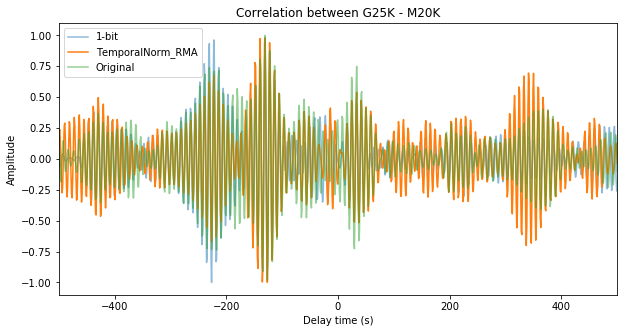

In [18]:
# stack results 
sumxc_trma=xcmatrix_trma[0]*0

count=0
for xc in xcmatrix_trma:
    if np.max(np.abs(xc))==0 or np.isnan(np.max(np.abs(xc))):
        continue
    sumxc_trma=sumxc_trma+np.multiply(1/np.max(np.abs(xc)),xc)
    
    
print('finished stacking! onto the plot..')

# plot final bp of stack
fmin=1/12 #1/Xsec
fmax = 1/8 #1/Xsec

fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')

xcorr_filt = scisignal.filtfilt(b, a, sumxc)
xcorrTRMA_filt = scisignal.filtfilt(b, a, sumxc_trma)
xcorr1b_filt = scisignal.filtfilt(b, a, sumxc_1bit)

#normalize
xcorr_filt=np.multiply(1/np.max(np.abs(xcorr_filt)),xcorr_filt) #normalize
xcorr1b_filt=np.multiply(1/np.max(np.abs(xcorr1b_filt)),xcorr1b_filt) #normalize
xcorrTRMA_filt=np.multiply(1/np.max(np.abs(xcorrTRMA_filt)),xcorrTRMA_filt) #normalize



fig=plt.figure(6,figsize=[10,5])
ax = fig.add_subplot(111)

ax.plot(tdel,xcorr1b_filt,label='1-bit',alpha=0.5)
ax.plot(tdel,xcorrTRMA_filt,label='TemporalNorm_RMA',alpha=1.0,linestyle='-')
ax.plot(tdel,xcorr_filt,label='Original',alpha=0.5)

ax.legend()
ax.set_xlim(-500, 500);
ax.set_xlabel('Delay time (s)');
ax.set_ylabel('Amplitude');
ax.set_title('Correlation between '+srcsta+' - '+recsta)
plt.show()

# Spectral Whitening


As you will see, some sort of normalization [in the frequency domain] is needed. For example, Bensen et al. (2007) suggest to prewhiten the signals before correlation, that is
\begin{equation}
X_{norm}(f) = \frac{\hat{X}(f)}{<S_{xx}(f)>}
\end{equation}
where the $<\cdot>$ represents some sort of averaged, or smoothed version of the term inside. Similar for $Y$, and then calculate the cross spectrum. 

This is equivalent to what is known as the coherency:
\begin{equation}
C_{xy}(f) = \frac{S_{xy}(f)}{\sqrt{<S_{xx}(f)><S_{yy}(f)>}}
\end{equation}



### Compute the normalized correlation instead (coherency)

To get a better behaved, broad band GF, we normalize the the PSD of both signals. In principle, similar to Bensen et al. 

In [19]:
# Spectral Whitening: Coherency

#Loop over 1 hour segments, correlate, and stack
corrlen=500 #total delay for the correlation
nminutes=360 #number of minutes in cross-correlation
winlen=int(nminutes*60/dt4) #convert from minutes to nsamples

hourinds=np.arange(0,len(src),winlen)
outsamples=int(corrlen/dt4)

xcmatrix_cohe=[]

for dayidx in dayarr:
    srcst=obspy.read(datadir+'/'+srcsta+'.'+comp+'.'+dayidx+'.mseed')
    recst=obspy.read(datadir+'/'+recsta+'.'+comp+'.'+dayidx+'.mseed')
    #print('srcst: ',srcst,'\n')
    #print('recst: ',recst,'\n')

    tr1    = srcst[0]
    src   = tr1.data
    tr2    = recst[0]
    rec    = tr2.data
    dt4    = tr1.stats.delta
    nx4    = tr1.stats.npts   
    t      = np.arange(nx4)*dt4

    for ii in range(len(hourinds)-1):
        #print('on time index: ',ii)
        starti=hourinds[ii]
        stopi=hourinds[ii+1]

        #Cut the traces to winlen
        ttsrc=src[starti:stopi]
        ttrec=rec[starti:stopi]

        ## Pre-Processing (demean, detrend, temporal normalization, spectral whitening, etc) ##
        #1. Demean
        x4    = scisignal.detrend(ttsrc,type='constant')
        y4    = scisignal.detrend(ttrec, type='constant')

        #print('demean complete')

        #2. Detrend
        x4    = scisignal.detrend(x4,type='linear')
        y4    = scisignal.detrend(y4, type='linear')

        #print('demean and detrend complete')

        # Calculate hanning taper info, with padding. 
        if ii==0:
            #no sense in getting these more than the inital run-through as should not change
            npts   = len(ttsrc)#nx4
            npts2  = 2*npts+1   # make padding odd. 
            npts2=scipy.fftpack.next_fast_len(npts2) #get faster array length for fft purposes

            nf4    = int((npts2+1)/2)  #cross-correlation window length 
            hann   = np.hanning(npts)
            #freq4  = np.fft.fftfreq(npts2,dt4) #return discrete fourier transform sample frequencies
            #df4    = freq4[1]


        #3. Taper signals, add padding
        dat_x4 = np.zeros(npts2)
        dat_y4 = np.zeros(npts2)
        dat_x4[0:npts] = x4*hann
        dat_y4[0:npts] = y4*hann

        #print('taper complete..')


        # FFT of data
        fx4   = np.fft.fft(dat_x4,npts2)
        fy4   = np.fft.fft(dat_y4,npts2)

        Px4   = abs(fx4)**2
        Py4   = abs(fy4)**2

        # Apply a smoothing operator, improve variance. 
        nsmooth = 10
        Px4_smooth = np.convolve(Px4, np.ones(nsmooth)/nsmooth)
        Py4_smooth = np.convolve(Py4, np.ones(nsmooth)/nsmooth)

        #print('applying fft complete')

        #Correlate
        Sxy    = np.conj(fx4)*fy4

        #### NEW!!!! Coherency!!! ####
        cohe = Sxy/(np.sqrt(Px4_smooth[0:npts2])*np.sqrt(Py4_smooth[0:npts2]))
        xycorr = np.real(np.fft.ifft(cohe))
        xycorr = np.fft.ifftshift(xycorr)


        #print('correlation complete')

        # Delay time vector, same as above.. only run on the first round
        if ii==0:
            tdel  = np.linspace(-nf4*dt4,nf4*dt4,npts2)

        xcmatrix_cohe.append(xycorr)
    

print('finished xcorr!')
 

finished xcorr!


/Users/emberg/opt/anaconda3/envs/anccrwe/lib/python3.7/site-packages/ipykernel_launcher.py:89: RuntimeWarning: invalid value encountered in true_divide


finished stacking! onto the plot..


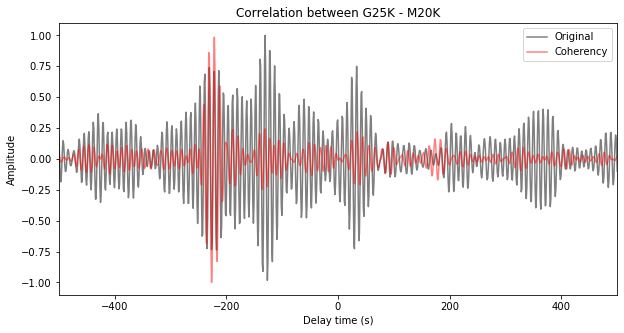

In [20]:
   
# stack results 
sumxc_cohe=xcmatrix_cohe[0]*0
for xc in xcmatrix_cohe:
    if np.max(np.abs(xc))==0 or np.isnan(np.max(np.abs(xc))):
        continue
    sumxc_cohe=sumxc_cohe+np.multiply(1/np.max(np.abs(xc)),xc)
print('finished stacking! onto the plot..')

# plot final bp of stack
# freq in Hz
fmin=1/12 #1/Xsec
fmax = 1/8 #1/Xsec



fnyq = 0.5/dt4
f0   = fmin/fnyq
f1   = fmax/fnyq
wn   = [f0,f1] 
b, a = scisignal.butter(4, wn,'bandpass')

xcorr_filt = scisignal.filtfilt(b, a, sumxc)
xcorrCohe_filt = scisignal.filtfilt(b, a, sumxc_cohe)


#normalize
xcorr_filt=np.multiply(1/np.max(np.abs(xcorr_filt)),xcorr_filt) #normalize
xcorrCohe_filt=np.multiply(1/np.max(np.abs(xcorrCohe_filt)),xcorrCohe_filt) #normalize

#nofilter..
#xycorr_filt=xycorr

# filter with obspy..
#xycorr_filt=obspy.signal.filter.bandpass(np.array(xycorr),freqmin=1.5,freqmax=2.5,df=25,corners=4,zerophase=True)


#Make a figure
fig=plt.figure(6,figsize=[10,5])
ax = fig.add_subplot(111)
ax.plot(tdel,xcorr_filt,label='Original',alpha=0.5,c='k')
ax.plot(tdel,xcorrCohe_filt,label='Coherency',alpha=0.5,linestyle='-',c='r')
ax.legend()
ax.set_xlim(-500, 500);
ax.set_xlabel('Delay time (s)');
ax.set_ylabel('Amplitude');
ax.set_title('Correlation between '+srcsta+' - '+recsta)
plt.show()


**What is the significance of the majority of the signal being on the acausal (<0 delay time) side of the cross-correlation?**

**Which normalization did you like the most / makes the most sense to you? Why? (This is a personal question with no singularly correct answer)**

**Extra Credit: Try a combination of the temporal whitening with the Spectral**

# Rayleigh-Wave Ellipticity Analysis

The ZZ, ZR, RZ, and RR components have been previously calculated. 

FYI,

ZR: Vertical excitation at the source station, traveling through the subsurface, and recorded on the radial component at the receiver station.


**How is ZR created (for example), if the components for each of the stations are E, N, and Z?**

*At what specific stage would you create the ZR cross-correlation (before or after correlation)?*

*In other words, would you want to create the Radial component from E and N right away?*

*Or, would you want to compute ZR from the ZE and ZN cross-correlations?*



**In your own words, why does ZR/ZZ give the H/V at the receiver station (causal side of cross-correlations)?**

**What combinations give H/V for the source station (causal side of cross-correlations)? Why (in your own words)?**



ZZ
ZR
RZ
RR
TT
ZT
TZ
TR
RT


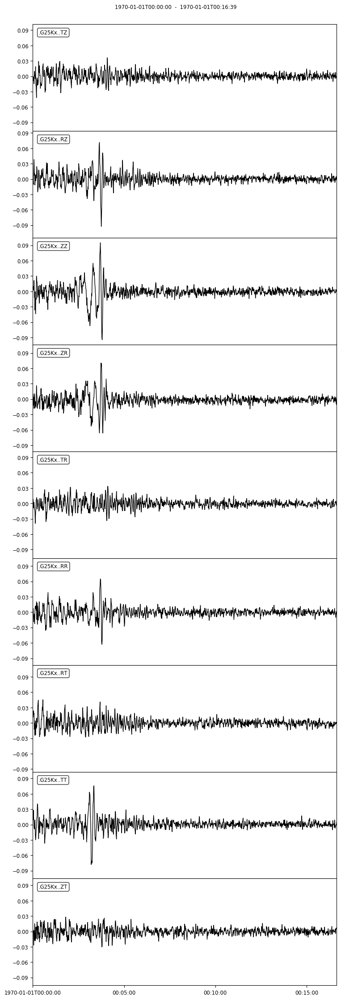

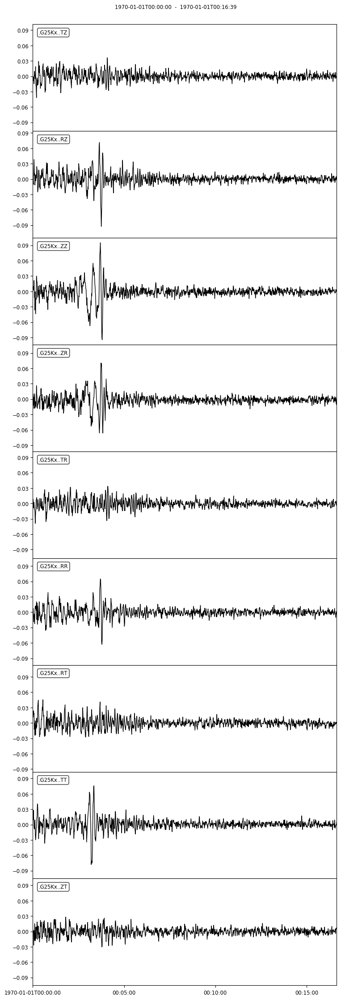

In [21]:
# Read in the symmetric, stacked results for ZZ, ZR, RZ, and RR
#read in the previously created stream (symmetric, so only causal side)..

stall=obspy.read(mdir+'/G25KxM20K_all_JanMarMayJulAugOct2017.mseed')
npts=stall[0].stats.npts
delta=stall[0].stats.delta

for tr in stall:
    print(tr.stats.channel)
    
stall.plot()


dist:  640981.0306664779
azab:  215.20170245649288
azba:  28.85816916624329
starttime (seconds):  117
endtime (seconds):  427
working on:  ZZ


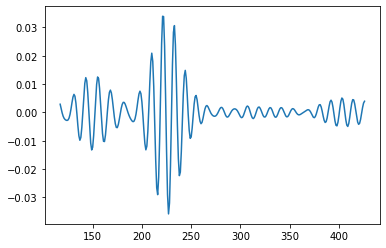

In [22]:
# Read in the symmetric, stacked results for ZZ, ZR, RZ, and RR


#%% Read in correlograms
minuv=1.50; maxuv=5.5 #min and max group velocities to know where to focus on the data

# set up period of interest
period=12
sta1='G25K'
sta2='M20K'

snr=8
dis=9*period
permax=period+2
permin=period-2


#read in the previously created stream (symmetric, so only causal side)..
stall=obspy.read(mdir+'/G25KxM20K_all_JanMarMayJulAugOct2017.mseed')

npts=stall[0].stats.npts
delta=stall[0].stats.delta

#G25K
sedlat=66.7653
sedlon=-146.1013

#M20K
mtnlat=61.8823
mtnlon=-153.1318

dist,azab,azba=obspy.geodetics.base.gps2dist_azimuth(sedlat, sedlon, mtnlat, mtnlon)
print('dist: ',dist)
print('azab: ',azab)
print('azba: ',azba)
dist=dist/1000 #convert from m to km

starttime=round(dist/maxuv)
endtime=round(dist/minuv)
print('starttime (seconds): ',starttime)
print('endtime (seconds): ',endtime)

minptsstart=starttime/delta
minptsend=endtime/delta
startpts=int(minptsstart) #if only causal side available
endpts=int(minptsend)
#startpts=int(((npts-1)*0.5)+minptsstart) #if both causal and acausal sides are available
#endpts=int(((npts-1)*0.5)+minptsend)

timeplotting=[]
for ii in np.arange(endpts-startpts):
    timeplotting.append(starttime+(ii*delta))
    
print('working on: ',stall[0].stats.channel)
stall[0].filter('bandpass',freqmin=(1./permax),freqmax=(1./permin),corners=2,zerophase=True)
zzseis=stall[0].data[startpts:endpts]
zzseisall=stall[0].data
###check all looks ok
timeplottingtmp=[]
#starttimetmp=-((npts-1)*0.5)
starttimetmp=0
for ii in np.arange(npts):
    timeplottingtmp.append(starttimetmp+(ii*delta))

plt.plot(timeplottingtmp[startpts:endpts],zzseis)

In [23]:
### read in ZR ###
print(stall[1].stats.channel)
stall[1].filter('bandpass',freqmin=(1./permax),freqmax=(1./permin),corners=2,zerophase=True)
zrseis=stall[1].data[startpts:endpts]
zrseisall=stall[1].data



ZR


In [24]:
#read in RZ#
print(stall[2].stats.channel)
stall[2].filter('bandpass',freqmin=(1./permax),freqmax=(1./permin),corners=2,zerophase=True)
rzseis=stall[2].data[startpts:endpts]
rzseisall=stall[2].data



RZ


In [25]:
#read in RR#
print(stall[3].stats.channel)
stall[3].filter('bandpass',freqmin=(1./permax),freqmax=(1./permin),corners=2,zerophase=True)
rrseis=stall[3].data[startpts:endpts]
rrseisall=stall[3].data


RR


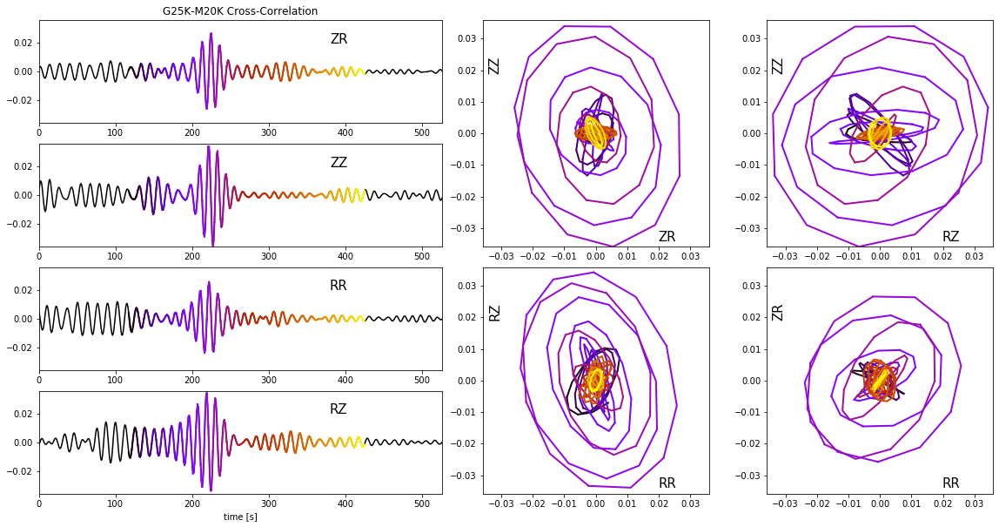

In [26]:
#%% Great, now plot up seismograms!

# plot seismograms first
fig=plt.figure(21,figsize=(20,10))
matplotlib.rcParams.update({'font.size': 10})
#seismograms
ax1=plt.subplot2grid((4,7), (0,0), colspan=3)
ax2=plt.subplot2grid((4,7), (1,0), colspan=3)
ax3=plt.subplot2grid((4,7), (2,0), colspan=3)
ax4=plt.subplot2grid((4,7), (3,0), colspan=3)

#particle motion
ax5=plt.subplot2grid((4,7), (0,3),rowspan=2,colspan=2) #upper left
ax5.set_aspect('equal', 'box')

ax6=plt.subplot2grid((4,7), (0,5),rowspan=2,colspan=2) #upper right
ax6.set_aspect('equal', 'box')

ax7=plt.subplot2grid((4,7), (2,3), rowspan=2,colspan=2) #lower left
ax7.set_aspect('equal', 'box')

ax8=plt.subplot2grid((4,7), (2,5), rowspan=2,colspan=2) #lower right
ax8.set_aspect('equal', 'box')


### SEISMOGRAMS ###
maxtmp=max(max(abs(zrseis)),max(abs(zzseis)),max(abs(rrseis)),max(abs(rzseis)))
#mintmp=min(max(zrseis),max(zzseis),max(rrseis),max(rzseis))

#annotation area
xann=min(timeplotting)+(0.85*(max(timeplotting)-min(timeplotting)))
yann=0.55*(maxtmp)

ax1.plot(timeplottingtmp,zrseisall,'k') #normal, boring plot...
n=len(timeplotting)

# Segement plot and colour depending on T
s = 2 # Segment length
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax1.plot(timeplotting[i:i+s+1],zrseis[i:i+s+1],c=c,lw=2)

ax1.annotate('ZR',(xann,yann),size=15)
ax1.set_ylim([-maxtmp,maxtmp])
ax1.set_xlim([0,max(timeplotting)+100])
#ax1.set_xlim([min(timeplotting),max(timeplotting)])
ax1.set_title(sta1+'-'+sta2+' Cross-Correlation')

ax2.plot(timeplottingtmp,zzseisall,'k')
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax2.plot(timeplotting[i:i+s+1],zzseis[i:i+s+1],c=c,lw=2)
ax2.annotate('ZZ',(xann,yann),size=15)
ax2.set_ylim([-maxtmp,maxtmp])
ax2.set_xlim([0,max(timeplotting)+100])


ax3.plot(timeplottingtmp,rrseisall,'k')
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax3.plot(timeplotting[i:i+s+1],rrseis[i:i+s+1],c=c,lw=2)
ax3.annotate('RR',(xann,yann),size=15)
ax3.set_ylim([-maxtmp,maxtmp])
ax3.set_xlim([0,max(timeplotting)+100])



ax4.plot(timeplottingtmp,rzseisall,'k')
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax4.plot(timeplotting[i:i+s+1],rzseis[i:i+s+1],c=c,lw=2)
ax4.annotate('RZ',(xann,yann),size=15)
ax4.set_ylim([-maxtmp,maxtmp])
ax4.set_xlabel('time [s]')
ax4.set_xlim([0,max(timeplotting)+100])



### Particle Motion ###

# upper left
# Your colouring array
n=len(timeplotting)
#T=np.linspace(0,1,np.size(timeplotting))**2

# Segement plot and colour depending on T
s = 2 # Segment length
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))

for i in range(0,n-s,s):
    c=next(color)
    #ax5.plot(zrseis[i:i+s+1],zzseis[i:i+s+1],color=(0.0,0.5,T[i]))
    ax5.plot(zrseis[i:i+s+1],zzseis[i:i+s+1],c=c,lw=2)

ax5.annotate('ZR',(0.55*maxtmp,-0.95*maxtmp),size=15) #xaxis
ax5.annotate('ZZ',(-0.95*maxtmp,0.55*maxtmp),size=15,rotation=90) #yaxis

ax5.set_xlim([-maxtmp,maxtmp])
ax5.set_ylim([-maxtmp,maxtmp])

#titlerec='Rec: '+sta2+'   H/V='+str(round(float(hvsta2),3))
#ax5.set_title(titlerec)

ax5.set_aspect('equal', 'box')
#ax5.contourf(zrseis,zzseis,timeplotting,cmap='jet')

#upper right?
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax6.plot(rzseis[i:i+s+1],zzseis[i:i+s+1],c=c,lw=2)
ax6.annotate('RZ',(0.55*maxtmp,-0.95*maxtmp),size=15) #xaxis
ax6.annotate('ZZ',(-0.95*maxtmp,0.55*maxtmp),size=15,rotation=90) #yaxis
ax6.set_xlim([-maxtmp,maxtmp])
ax6.set_ylim([-maxtmp,maxtmp])
#titlesrc='Src: '+sta1+'   H/V='+str(round(float(hvsta1),3))
#ax6.set_title(titlesrc)

ax6.set_aspect('equal', 'box')

#lower left
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax7.plot(rrseis[i:i+s+1],rzseis[i:i+s+1],c=c,lw=2)
ax7.annotate('RR',(0.55*maxtmp,-0.95*maxtmp),size=15) #xaxis
ax7.annotate('RZ',(-0.95*maxtmp,0.55*maxtmp),size=15,rotation=90) #yaxis
ax7.set_xlim([-maxtmp,maxtmp])
ax7.set_ylim([-maxtmp,maxtmp])
ax7.set_aspect('equal', 'box')

#lower right
color=iter(plt.cm.gnuplot(np.linspace(0,1,len(range(0,n-s,s)))))
for i in range(0,n-s,s):
    c=next(color)
    ax8.plot(rrseis[i:i+s+1],zrseis[i:i+s+1],c=c,lw=2)
ax8.annotate('RR',(0.55*maxtmp,-0.95*maxtmp),size=15) #xaxis
ax8.annotate('ZR',(-0.95*maxtmp,0.55*maxtmp),size=15,rotation=90) #yaxis
ax8.set_xlim([-maxtmp,maxtmp])
ax8.set_ylim([-maxtmp,maxtmp])
ax8.set_aspect('equal', 'box')


**From the particle motion plots, what H/V values do you expect for the basin station? Does this make sense, and why / why not?**

**From the particle motion plots, what H/V values do you expect for the mountain station? Does this make sense, and why / why not?**


**Extra Credit: Compute your own ZZ, ZR, RZ, and RR correlations from one month of data for a combination of basin and mountain stations (apply some form of whitening and rotation)**

**Extra Credit: Plot the particle motions for a specific frequency range from the ZZ, ZR, RZ, and RR correlations. Discuss if this does / does not make sense**